In [1]:
"""
FILE 1: Core Model Classes and Functions
==========================================
This file contains all the class definitions and utility functions.
Import this in your Jupyter notebook before training or inference.

Usage in Jupyter:
    %run 1_model_classes.py
"""

import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from typing import List, Tuple, Dict, Optional, Union, Any
from dataclasses import dataclass
from pathlib import Path
import cv2
from PIL import Image
import faiss
from tqdm import tqdm
import json
import pickle
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')


# ==================== CONFIGURATION ====================
KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]


# ==================== DATA CLASSES ====================
@dataclass
class PatchInfo:
    """Store information about a patch"""
    image_path: str
    image_idx: int
    x: int
    y: int
    width: int
    height: int
    kernel_size: Tuple[int, int]
    embedding: Optional[np.ndarray] = None


@dataclass
class RetrievalResult:
    """Store retrieval results"""
    patch_info: PatchInfo
    similarity_score: float
    query_patch_info: Optional[Dict[str, Any]] = None


@dataclass
class MergedPatch:
    """Represents a merged patch from overlapping patches"""
    image_path: str
    x_min: int
    y_min: int
    x_max: int
    y_max: int
    width: int
    height: int
    contributing_patches: List[RetrievalResult]
    avg_score: float
    max_score: float
    kernel_sizes: List[Tuple[int, int]]


# ==================== MODEL WRAPPER ====================
class SatelliteModelWrapper:
    """Wrapper for satellite image models with proper DINOv3 handling."""

    def __init__(self, model_name: str = "dinov3", device: str = "cuda"):
        self.device = torch.device(device if torch.cuda.is_available() else "cpu")
        self.model_name = model_name.lower()
        self.processor = None
        self.model = None
        self.preprocess = None
        self.model, self.preprocess = self._load_model()

    def _load_model(self):
        """Load the specified satellite image model"""
        if self.model_name == "dinov2":
            model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
            model = model.to(self.device)
            model.eval()

            from torchvision import transforms
            preprocess = transforms.Compose([
                transforms.Resize(224),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
            ])

        elif self.model_name == "dinov3":
            from transformers import AutoImageProcessor, AutoModel

            pretrained_model_name = "facebook/dinov3-vitb16-pretrain-lvd1689m"
            print(f"Loading DINOv3 model: {pretrained_model_name}")

            self.processor = AutoImageProcessor.from_pretrained(pretrained_model_name)
            model = AutoModel.from_pretrained(pretrained_model_name)
            model = model.to(self.device)
            model.eval()

            print(f"DINOv3 model loaded. Hidden size: {model.config.hidden_size}")

            def preprocess(image: Image.Image) -> Dict[str, torch.Tensor]:
                if image.mode != 'RGB':
                    image = image.convert('RGB')
                inputs = self.processor(images=image, return_tensors="pt")
                return inputs

            preprocess = preprocess

        else:
            raise ValueError(f"Unsupported model: {self.model_name}")

        return model, preprocess

    @torch.no_grad()
    def extract_features(self, images: Union[torch.Tensor, np.ndarray, Dict[str, torch.Tensor]]) -> np.ndarray:
        """Extract features with proper handling for all input types"""
        if self.model_name == "dinov3":
            if not isinstance(images, dict):
                raise ValueError("DINOv3 requires a dict input from the processor.")

            inputs = {k: v.to(self.device) for k, v in images.items()}
            outputs = self.model(**inputs)

            if hasattr(outputs, "last_hidden_state") and outputs.last_hidden_state is not None:
                cls_embeddings = outputs.last_hidden_state[:, 0]
                features = cls_embeddings
            elif hasattr(outputs, "pooler_output") and outputs.pooler_output is not None:
                features = outputs.pooler_output
            else:
                last = outputs.last_hidden_state
                features = last[:, 1:].mean(dim=1)

            features = torch.nn.functional.normalize(features, p=2, dim=1)
            return features.cpu().numpy()

        else:
            if isinstance(images, np.ndarray):
                images = torch.from_numpy(images).to(self.device)
            elif isinstance(images, torch.Tensor):
                images = images.to(self.device)

            features = self.model(images)

            if isinstance(features, dict):
                if 'x_norm_clstoken' in features:
                    features = features['x_norm_clstoken']
                elif 'x_norm_patchtokens' in features:
                    features = features['x_norm_patchtokens'].mean(dim=1)
                elif 'pooled' in features:
                    features = features['pooled']
                else:
                    features = features.get('last_hidden_state', features).mean(dim=1)
            else:
                if features.ndim == 4:
                    features = features.squeeze(-1).squeeze(-1)
                elif features.ndim == 2:
                    pass
                else:
                    features = features.view(features.shape[0], -1)

            if isinstance(features, torch.Tensor):
                features = torch.nn.functional.normalize(features, p=2, dim=1)

            return features.cpu().numpy()


# ==================== DATASET ====================
class FixedKernelPatchDataset(Dataset):
    """Dataset for loading patches with specific kernel size"""

    def __init__(self, image_path: str, kernel_size: Tuple[int, int],
                 stride: Tuple[int, int] = None, transform=None, min_patch_std: float = 5.0):
        self.image_path = image_path
        self.kernel_size = kernel_size
        self.stride = stride if stride else (kernel_size[0] // 2, kernel_size[1] // 2)
        self.transform = transform
        self.min_patch_std = min_patch_std

        self.image = cv2.imread(image_path)
        if self.image is None:
            raise ValueError(f"Could not load image: {image_path}")
        self.image = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        self.h, self.w = self.image.shape[:2]

        self.patches = []
        for y in range(0, max(1, self.h - kernel_size[1] + 1), self.stride[1]):
            for x in range(0, max(1, self.w - kernel_size[0] + 1), self.stride[0]):
                patch = self.image[y:y + kernel_size[1], x:x + kernel_size[0]]

                if patch.shape[0] == kernel_size[1] and patch.shape[1] == kernel_size[0]:
                    if np.std(patch) > self.min_patch_std:
                        self.patches.append((x, y))

    def __len__(self):
        return len(self.patches)

    def __getitem__(self, idx):
        x, y = self.patches[idx]
        patch = self.image[y:y + self.kernel_size[1], x:x + self.kernel_size[0]]

        if self.transform:
            pil = Image.fromarray(patch)
            transformed = self.transform(pil)
        else:
            pil = Image.fromarray(patch)
            transformed = pil

        return transformed, (x, y)


# ==================== QUERY HANDLER ====================
class QueryImageHandler:
    """Handle variable-sized query images"""

    @staticmethod
    def extract_query_patches(query_image: Union[str, np.ndarray],
                             kernel_size: Tuple[int, int],
                             stride_ratio: float = 0.5) -> List[Dict[str, Any]]:
        """Extract fixed-size patches from a query image"""
        if isinstance(query_image, str):
            img = cv2.imread(query_image)
            if img is None:
                raise ValueError(f"Could not load query image: {query_image}")
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            img = query_image.copy()

        h, w = img.shape[:2]
        patches = []

        if h < kernel_size[1] or w < kernel_size[0]:
            scale = max(kernel_size[1] / h, kernel_size[0] / w)
            new_h, new_w = int(h * scale), int(w * scale)
            img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
            h, w = new_h, new_w

        stride = (max(1, int(kernel_size[0] * (1 - stride_ratio))),
                 max(1, int(kernel_size[1] * (1 - stride_ratio))))

        patch_count = 0
        for y in range(0, max(1, h - kernel_size[1] + 1), stride[1]):
            for x in range(0, max(1, w - kernel_size[0] + 1), stride[0]):
                patch = img[y:y + kernel_size[1], x:x + kernel_size[0]]

                if patch.shape[0] == kernel_size[1] and patch.shape[1] == kernel_size[0]:
                    patches.append({
                        'image': patch,
                        'x': x,
                        'y': y,
                        'width': kernel_size[0],
                        'height': kernel_size[1],
                        'patch_id': patch_count,
                        'original_size': (h, w)
                    })
                    patch_count += 1

        if len(patches) == 0:
            center_x = max(0, (w - kernel_size[0]) // 2)
            center_y = max(0, (h - kernel_size[1]) // 2)
            patch = img[center_y:center_y + kernel_size[1], center_x:center_x + kernel_size[0]]

            if patch.shape[0] < kernel_size[1] or patch.shape[1] < kernel_size[0]:
                pad_h = max(0, kernel_size[1] - patch.shape[0])
                pad_w = max(0, kernel_size[0] - patch.shape[1])
                patch = cv2.copyMakeBorder(patch, 0, pad_h, 0, pad_w, cv2.BORDER_REFLECT)

            patches.append({
                'image': patch,
                'x': center_x,
                'y': center_y,
                'width': kernel_size[0],
                'height': kernel_size[1],
                'patch_id': 0,
                'original_size': (h, w)
            })

        return patches


# ==================== PATCH MERGER ====================
class PatchMerger:
    """Merge overlapping patches into unified regions"""

    @staticmethod
    def compute_iou(patch1: Union[PatchInfo, RetrievalResult], 
                    patch2: Union[PatchInfo, RetrievalResult]) -> float:
        """Compute IoU between two patches"""
        p1 = patch1.patch_info if isinstance(patch1, RetrievalResult) else patch1
        p2 = patch2.patch_info if isinstance(patch2, RetrievalResult) else patch2

        x1_min, y1_min = p1.x, p1.y
        x1_max, y1_max = x1_min + p1.width, y1_min + p1.height

        x2_min, y2_min = p2.x, p2.y
        x2_max, y2_max = x2_min + p2.width, y2_min + p2.height

        x_inter_min = max(x1_min, x2_min)
        y_inter_min = max(y1_min, y2_min)
        x_inter_max = min(x1_max, x2_max)
        y_inter_max = min(y1_max, y2_max)

        if x_inter_max <= x_inter_min or y_inter_max <= y_inter_min:
            return 0.0

        intersection = (x_inter_max - x_inter_min) * (y_inter_max - y_inter_min)
        area1 = p1.width * p1.height
        area2 = p2.width * p2.height
        union = area1 + area2 - intersection
        return intersection / union if union > 0 else 0.0

    @staticmethod
    def merge_overlapping_patches(results: List[RetrievalResult], 
                                 iou_threshold: float = 0.3) -> List[MergedPatch]:
        """Merge overlapping patches from same image into unified regions"""
        image_groups = defaultdict(list)
        for result in results:
            image_groups[result.patch_info.image_path].append(result)

        merged_patches = []

        for img_path, img_results in image_groups.items():
            img_results.sort(key=lambda x: x.similarity_score, reverse=True)
            
            merged_groups = []
            used = set()

            for i, result1 in enumerate(img_results):
                if i in used:
                    continue

                group = [result1]
                used.add(i)

                for j, result2 in enumerate(img_results):
                    if j in used or j <= i:
                        continue

                    overlaps = False
                    for group_result in group:
                        iou = PatchMerger.compute_iou(group_result, result2)
                        if iou > iou_threshold:
                            overlaps = True
                            break

                    if overlaps:
                        group.append(result2)
                        used.add(j)

                merged_groups.append(group)

            for group in merged_groups:
                x_min = min(r.patch_info.x for r in group)
                y_min = min(r.patch_info.y for r in group)
                x_max = max(r.patch_info.x + r.patch_info.width for r in group)
                y_max = max(r.patch_info.y + r.patch_info.height for r in group)

                scores = [r.similarity_score for r in group]
                kernel_sizes = list(set(r.patch_info.kernel_size for r in group))

                merged = MergedPatch(
                    image_path=img_path,
                    x_min=x_min,
                    y_min=y_min,
                    x_max=x_max,
                    y_max=y_max,
                    width=x_max - x_min,
                    height=y_max - y_min,
                    contributing_patches=group,
                    avg_score=np.mean(scores),
                    max_score=np.max(scores),
                    kernel_sizes=kernel_sizes
                )
                merged_patches.append(merged)

        merged_patches.sort(key=lambda x: x.avg_score, reverse=True)
        return merged_patches

    @staticmethod
    def visualize_merged_patches(merged_patches: List[MergedPatch],
                                query_image: Union[str, np.ndarray],
                                max_display: int = 6,
                                save_path: Optional[str] = None):
        """Visualize merged patches on source images"""
        if not merged_patches:
            print("No merged patches to visualize")
            return

        num_display = min(max_display, len(merged_patches))
        fig, axes = plt.subplots(2, num_display + 1, figsize=(5 * (num_display + 1), 10))

        if axes.ndim == 1:
            axes = axes.reshape(2, -1)

        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        axes[0, 0].imshow(query_img)
        axes[0, 0].set_title(f"Query Image\n{query_img.shape[1]}×{query_img.shape[0]} px",
                            fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')

        axes[1, 0].text(0.5, 0.5, "Merged Patches\n(Combined from all kernels)",
                       ha='center', va='center', transform=axes[1, 0].transAxes,
                       fontsize=11, fontweight='bold')
        axes[1, 0].axis('off')

        for idx, merged in enumerate(merged_patches[:num_display]):
            col = idx + 1

            try:
                source_img = cv2.imread(merged.image_path)
                if source_img is not None:
                    source_img = cv2.cvtColor(source_img, cv2.COLOR_BGR2RGB)
                    img_h, img_w = source_img.shape[:2]

                    axes[0, col].imshow(source_img)
                    
                    rect = mpatches.Rectangle(
                        (merged.x_min, merged.y_min),
                        merged.width,
                        merged.height,
                        linewidth=4,
                        edgecolor='red',
                        facecolor='none',
                        linestyle='-'
                    )
                    axes[0, col].add_patch(rect)

                    colors = ['yellow', 'cyan', 'magenta']
                    for i, result in enumerate(merged.contributing_patches):
                        color = colors[i % len(colors)]
                        rect_inner = mpatches.Rectangle(
                            (result.patch_info.x, result.patch_info.y),
                            result.patch_info.width,
                            result.patch_info.height,
                            linewidth=2,
                            edgecolor=color,
                            facecolor='none',
                            linestyle='--',
                            alpha=0.7
                        )
                        axes[0, col].add_patch(rect_inner)

                    title = f"Avg: {merged.avg_score:.3f} | Max: {merged.max_score:.3f}\n"
                    title += f"{Path(merged.image_path).name}\n"
                    title += f"Merged: {merged.width}×{merged.height} px"
                    axes[0, col].set_title(title, fontsize=9)
                    axes[0, col].axis('off')

                    y_start = max(0, merged.y_min)
                    y_end = min(img_h, merged.y_max)
                    x_start = max(0, merged.x_min)
                    x_end = min(img_w, merged.x_max)

                    merged_patch = source_img[y_start:y_end, x_start:x_end]

                    if merged_patch.size > 0:
                        axes[1, col].imshow(merged_patch)
                        info = f"{len(merged.contributing_patches)} patches merged\n"
                        info += f"Kernels: {', '.join([f'{k[0]}×{k[1]}' for k in merged.kernel_sizes])}"
                        axes[1, col].set_title(info, fontsize=9)
                    else:
                        axes[1, col].text(0.5, 0.5, "Empty", ha='center', va='center',
                                        transform=axes[1, col].transAxes)
                    axes[1, col].axis('off')

            except Exception as e:
                print(f"Error visualizing merged patch: {e}")
                for row in [0, 1]:
                    axes[row, col].text(0.5, 0.5, f"Error", ha='center', va='center',
                                       transform=axes[row, col].transAxes, color='red')
                    axes[row, col].axis('off')

        plt.tight_layout()
        plt.show()


# ==================== MULTI-KERNEL RETRIEVAL SYSTEM ====================
class MultiKernelRetrievalSystem:
    """System for comparing results across multiple kernel sizes"""

    def __init__(self,
                 model_name: str = "dinov3",
                 kernel_sizes: List[Tuple[int, int]] = KERNEL_SIZES,
                 device: str = "cuda",
                 batch_size: int = 16):
        self.model_wrapper = SatelliteModelWrapper(model_name, device)
        self.kernel_sizes = kernel_sizes
        self.batch_size = batch_size
        self.device = device
        
        self.systems = {}
        for kernel_size in kernel_sizes:
            from types import SimpleNamespace
            system = SimpleNamespace()
            system.kernel_size = kernel_size
            system.index = None
            system.patch_database = []
            system.dimension = None
            self.systems[kernel_size] = system

        self.query_handler = QueryImageHandler()
        self.patch_merger = PatchMerger()

    def _collate_fn(self, batch):
        """Collate function for dataloader"""
        patches, positions = zip(*batch)
        first = patches[0]

        if hasattr(first, 'data') and isinstance(first.data, dict):
            batched = {}
            for k in first.data.keys():
                tensors = [p.data[k] for p in patches]
                batched[k] = torch.cat(tensors, dim=0)
            return batched, list(positions)
        elif isinstance(first, dict):
            batched = {}
            for k in first.keys():
                tensors = [p[k] for p in patches]
                batched[k] = torch.cat(tensors, dim=0)
            return batched, list(positions)
        elif isinstance(first, torch.Tensor):
            batched = torch.stack(patches, dim=0)
            return batched, list(positions)
        else:
            return list(patches), list(positions)

    def process_dataset_all_kernels(self,
                                    image_paths: List[str],
                                    overlap_ratio: float = 0.5,
                                    save_prefix: Optional[str] = None):
        """Process dataset with all kernel sizes"""
        print("=" * 80)
        print(f"Processing dataset with {len(self.kernel_sizes)} kernel sizes")
        print("=" * 80)

        for kernel_size in self.kernel_sizes:
            print(f"\n{'='*60}")
            print(f"Processing with kernel size: {kernel_size[0]}×{kernel_size[1]}")
            print(f"{'='*60}")

            system = self.systems[kernel_size]
            stride = (max(1, int(kernel_size[0] * (1 - overlap_ratio))),
                     max(1, int(kernel_size[1] * (1 - overlap_ratio))))

            all_embeddings = []

            for img_idx, img_path in enumerate(tqdm(image_paths, desc=f"Processing {kernel_size}")):
                try:
                    if self.model_wrapper.model_name == "dinov3":
                        transform = lambda pil: self.model_wrapper.preprocess(pil)
                    else:
                        transform = self.model_wrapper.preprocess

                    dataset = FixedKernelPatchDataset(
                        img_path,
                        kernel_size=kernel_size,
                        stride=stride,
                        transform=transform,
                        min_patch_std=5.0
                    )

                    if len(dataset) == 0:
                        continue

                    dataloader = DataLoader(
                        dataset,
                        batch_size=self.batch_size,
                        shuffle=False,
                        num_workers=2,
                        collate_fn=self._collate_fn
                    )

                    for batch_patches, positions in dataloader:
                        try:
                            embeddings = self.model_wrapper.extract_features(batch_patches)

                            for emb, (x, y) in zip(embeddings, positions):
                                patch_info = PatchInfo(
                                    image_path=img_path,
                                    image_idx=img_idx,
                                    x=int(x),
                                    y=int(y),
                                    width=kernel_size[0],
                                    height=kernel_size[1],
                                    kernel_size=kernel_size,
                                    embedding=emb
                                )
                                system.patch_database.append(patch_info)
                                all_embeddings.append(emb)
                        except Exception as e:
                            print(f"Error processing batch: {e}")
                            continue

                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
                    continue

            if not all_embeddings:
                print(f"Warning: No patches extracted for kernel size {kernel_size}")
                continue

            all_embeddings = np.array(all_embeddings).astype('float32')
            system.dimension = all_embeddings.shape[1]

            print(f"Building index: {len(all_embeddings)} patches, dim {system.dimension}")
            system.index = faiss.IndexFlatIP(system.dimension)
            system.index.add(all_embeddings)

            if save_prefix:
                save_path = f"{save_prefix}_k{kernel_size[0]}x{kernel_size[1]}"
                faiss.write_index(system.index, f"{save_path}_faiss.index")
                with open(f"{save_path}_patches.pkl", 'wb') as f:
                    pickle.dump(system.patch_database, f)
                
                metadata = {
                    'kernel_size': kernel_size,
                    'num_patches': len(system.patch_database),
                    'dimension': system.dimension
                }
                with open(f"{save_path}_metadata.json", 'w') as f:
                    json.dump(metadata, f)
                
                print(f"Saved index for kernel {kernel_size}")

            print(f"✅ Completed: {len(system.patch_database)} patches")

    def load_saved_indexes(self, index_prefix: str):
        """Load pre-computed indexes from disk"""
        print(f"\n📂 Loading pre-computed indexes from: {index_prefix}")
        
        for kernel_size in self.kernel_sizes:
            index_path = f"{index_prefix}_k{kernel_size[0]}x{kernel_size[1]}"
            try:
                self.systems[kernel_size].index = faiss.read_index(f"{index_path}_faiss.index")
                
                with open(f"{index_path}_patches.pkl", 'rb') as f:
                    self.systems[kernel_size].patch_database = pickle.load(f)
                
                with open(f"{index_path}_metadata.json", 'r') as f:
                    metadata = json.load(f)
                    self.systems[kernel_size].dimension = metadata['dimension']
                
                print(f"  ✓ Loaded kernel {kernel_size[0]}×{kernel_size[1]}: "
                      f"{len(self.systems[kernel_size].patch_database)} patches")
            
            except Exception as e:
                print(f"  ✗ Failed to load kernel {kernel_size[0]}×{kernel_size[1]}: {e}")

    def search_all_kernels(self,
                          query_image: Union[str, np.ndarray],
                          top_k: int = 20,
                          query_stride_ratio: float = 0.5,
                          aggregation: str = "max") -> Dict[Tuple[int, int], List[RetrievalResult]]:
        """Search with all kernel sizes"""
        all_results = {}

        print(f"\n{'='*80}")
        print("Searching with all kernel sizes")
        print(f"{'='*80}")

        for kernel_size in self.kernel_sizes:
            print(f"\n🔍 Searching with kernel {kernel_size[0]}×{kernel_size[1]}...")
            
            system = self.systems[kernel_size]
            if system.index is None:
                print(f"  ⚠️  Index not built for {kernel_size}")
                continue

            query_patches = self.query_handler.extract_query_patches(
                query_image,
                kernel_size=kernel_size,
                stride_ratio=query_stride_ratio
            )

            all_matches = defaultdict(lambda: {'scores': [], 'query_patches': []})

            for patch_info in query_patches:
                patch_img = patch_info['image']

                if self.model_wrapper.model_name == "dinov3":
                    pil_img = Image.fromarray(patch_img)
                    inputs = self.model_wrapper.preprocess(pil_img)
                    if hasattr(inputs, 'data'):
                        processed_inputs = inputs.data
                    else:
                        processed_inputs = inputs
                    embedding = self.model_wrapper.extract_features(processed_inputs)
                else:
                    pil_img = Image.fromarray(patch_img)
                    img_tensor = self.model_wrapper.preprocess(pil_img).unsqueeze(0)
                    embedding = self.model_wrapper.extract_features(img_tensor)

                embedding = embedding.flatten().reshape(1, -1).astype('float32')
                similarities, indices = system.index.search(embedding, top_k * 2)

                for sim, idx in zip(similarities[0], indices[0]):
                    if idx != -1:
                        all_matches[idx]['scores'].append(float(sim))
                        all_matches[idx]['query_patches'].append(patch_info)

            results = []
            for idx, data in all_matches.items():
                if aggregation == "max":
                    final_score = max(data['scores'])
                elif aggregation == "mean":
                    final_score = np.mean(data['scores'])
                else:
                    final_score = max(data['scores'])

                patch_info = system.patch_database[idx]
                result = RetrievalResult(
                    patch_info=patch_info,
                    similarity_score=final_score,
                    query_patch_info={'num_matches': len(data['scores'])}
                )
                results.append(result)

            results.sort(key=lambda x: x.similarity_score, reverse=True)
            results = results[:top_k]
            all_results[kernel_size] = results

            print(f"  ✅ Found {len(results)} results. Top score: {results[0].similarity_score:.4f}" if results else "  No results")

        return all_results

    def visualize_separate_kernel_results(self,
                                         all_results: Dict[Tuple[int, int], List[RetrievalResult]],
                                         query_image: Union[str, np.ndarray],
                                         num_display: int = 5,
                                         save_prefix: Optional[str] = None):
        """Visualize results separately for each kernel size"""
        print(f"\n{'='*80}")
        print("Creating separate visualizations for each kernel size")
        print(f"{'='*80}")

        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        for kernel_size, results in all_results.items():
            if not results:
                continue

            print(f"\n📊 Visualizing kernel {kernel_size[0]}×{kernel_size[1]}")
            
            num_show = min(num_display, len(results))
            fig, axes = plt.subplots(2, num_show + 1, figsize=(4 * (num_show + 1), 8))

            if axes.ndim == 1:
                axes = axes.reshape(2, -1)

            axes[0, 0].imshow(query_img)
            axes[0, 0].set_title(f"Query Image\nKernel: {kernel_size[0]}×{kernel_size[1]}",
                                fontsize=11, fontweight='bold')
            axes[0, 0].axis('off')

            axes[1, 0].text(0.5, 0.5, f"Matched Patches\n{kernel_size[0]}×{kernel_size[1]} px",
                           ha='center', va='center', transform=axes[1, 0].transAxes,
                           fontsize=10, fontweight='bold')
            axes[1, 0].axis('off')

            for idx, result in enumerate(results[:num_show]):
                col = idx + 1

                try:
                    full_img = cv2.imread(result.patch_info.image_path)
                    if full_img is not None:
                        full_img = cv2.cvtColor(full_img, cv2.COLOR_BGR2RGB)
                        img_h, img_w = full_img.shape[:2]

                        axes[0, col].imshow(full_img)
                        rect = mpatches.Rectangle(
                            (result.patch_info.x, result.patch_info.y),
                            result.patch_info.width,
                            result.patch_info.height,
                            linewidth=3,
                            edgecolor='red',
                            facecolor='none'
                        )
                        axes[0, col].add_patch(rect)
                        axes[0, col].set_title(f"Score: {result.similarity_score:.3f}\n{Path(result.patch_info.image_path).name}",
                                              fontsize=9)
                        axes[0, col].axis('off')

                        y_start = max(0, result.patch_info.y)
                        y_end = min(img_h, result.patch_info.y + result.patch_info.height)
                        x_start = max(0, result.patch_info.x)
                        x_end = min(img_w, result.patch_info.x + result.patch_info.width)
                        patch = full_img[y_start:y_end, x_start:x_end]

                        if patch.size > 0:
                            axes[1, col].imshow(patch)
                            axes[1, col].set_title(f"({result.patch_info.x},{result.patch_info.y})",
                                                  fontsize=8)
                        axes[1, col].axis('off')

                except Exception as e:
                    for row in [0, 1]:
                        axes[row, col].text(0.5, 0.5, "Error", ha='center', va='center',
                                           transform=axes[row, col].transAxes, color='red')
                        axes[row, col].axis('off')

            plt.tight_layout()
            plt.show()

    def visualize_combined_all_kernels(self,
                                      all_results: Dict[Tuple[int, int], List[RetrievalResult]],
                                      query_image: Union[str, np.ndarray],
                                      num_display_per_kernel: int = 3,
                                      save_path: Optional[str] = None):
        """Visualize all kernel results in one combined figure"""
        print(f"\n{'='*80}")
        print("Creating COMBINED visualization with all kernel sizes")
        print(f"{'='*80}")

        if isinstance(query_image, str):
            query_img = cv2.imread(query_image)
            query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB) if query_img is not None else np.zeros((100, 100, 3))
        else:
            query_img = query_image

        num_kernels = len(all_results)
        fig = plt.figure(figsize=(20, 6 * num_kernels))
        gs = fig.add_gridspec(num_kernels, num_display_per_kernel + 2, 
                             hspace=0.3, wspace=0.3)

        fig.suptitle('Multi-Kernel Retrieval Results Comparison', 
                    fontsize=16, fontweight='bold', y=0.995)

        ax_query = fig.add_subplot(gs[:, 0])
        ax_query.imshow(query_img)
        ax_query.set_title(f"Query Image\n{query_img.shape[1]}×{query_img.shape[0]} px",
                          fontsize=14, fontweight='bold')
        ax_query.axis('off')

        kernel_colors = {
            (75, 75): 'cyan',
            (85, 85): 'yellow',
            (95, 95): 'magenta'
        }

        row_idx = 0
        for kernel_size, results in sorted(all_results.items()):
            if not results:
                row_idx += 1
                continue

            ax_label = fig.add_subplot(gs[row_idx, 1])
            label_text = f"Kernel Size:\n{kernel_size[0]}×{kernel_size[1]} px\n\n"
            label_text += f"Top Score:\n{results[0].similarity_score:.3f}\n\n"
            label_text += f"Results:\n{len(results)}"
            ax_label.text(0.5, 0.5, label_text, ha='center', va='center',
                         fontsize=12, fontweight='bold',
                         bbox=dict(boxstyle='round', facecolor=kernel_colors.get(kernel_size, 'lightgray'), alpha=0.3))
            ax_label.axis('off')

            for idx in range(num_display_per_kernel):
                col = idx + 2
                
                if idx < len(results):
                    result = results[idx]
                    ax = fig.add_subplot(gs[row_idx, col])

                    try:
                        full_img = cv2.imread(result.patch_info.image_path)
                        if full_img is not None:
                            full_img = cv2.cvtColor(full_img, cv2.COLOR_BGR2RGB)

                            ax.imshow(full_img)
                            rect = mpatches.Rectangle(
                                (result.patch_info.x, result.patch_info.y),
                                result.patch_info.width,
                                result.patch_info.height,
                                linewidth=4,
                                edgecolor=kernel_colors.get(kernel_size, 'red'),
                                facecolor='none'
                            )
                            ax.add_patch(rect)
                            
                            title = f"#{idx+1}: {result.similarity_score:.3f}\n"
                            title += f"{Path(result.patch_info.image_path).name}\n"
                            title += f"({result.patch_info.x},{result.patch_info.y})"
                            ax.set_title(title, fontsize=9)
                        else:
                            ax.text(0.5, 0.5, "Image Not Found", ha='center', va='center',
                                   transform=ax.transAxes, color='red')
                    except Exception as e:
                        ax.text(0.5, 0.5, f"Error", ha='center', va='center',
                               transform=ax.transAxes, color='red', fontsize=8)
                    
                    ax.axis('off')
                else:
                    ax = fig.add_subplot(gs[row_idx, col])
                    ax.axis('off')

            row_idx += 1

        plt.show()

    def merge_and_visualize_all_patches(self,
                                       all_results: Dict[Tuple[int, int], List[RetrievalResult]],
                                       query_image: Union[str, np.ndarray],
                                       iou_threshold: float = 0.3,
                                       max_display: int = 8,
                                       save_path: Optional[str] = None):
        """Merge overlapping patches from all kernels and visualize"""
        print(f"\n{'='*80}")
        print("MERGING OVERLAPPING PATCHES FROM ALL KERNELS")
        print(f"{'='*80}")

        all_combined_results = []
        for kernel_size, results in all_results.items():
            all_combined_results.extend(results)

        print(f"Total patches across all kernels: {len(all_combined_results)}")

        merged_patches = self.patch_merger.merge_overlapping_patches(
            all_combined_results, 
            iou_threshold=iou_threshold
        )

        print(f"After merging: {len(merged_patches)} unified regions")
        print(f"\n📊 Merged Patches Summary:")
        for i, merged in enumerate(merged_patches[:10], 1):
            kernels_str = ', '.join([f"{k[0]}×{k[1]}" for k in merged.kernel_sizes])
            print(f"  {i}. {Path(merged.image_path).name}")
            print(f"     Size: {merged.width}×{merged.height} px | "
                  f"Scores: avg={merged.avg_score:.3f}, max={merged.max_score:.3f}")
            print(f"     Combined from {len(merged.contributing_patches)} patches "
                  f"(kernels: {kernels_str})")

        self.patch_merger.visualize_merged_patches(
            merged_patches,
            query_image,
            max_display=max_display,
            save_path=save_path
        )

        return merged_patches


print("✅ Model classes and functions loaded successfully!")
print(f"   Available kernel sizes: {KERNEL_SIZES}")
print(f"   Ready for training and inference!")

✅ Model classes and functions loaded successfully!
   Available kernel sizes: [(75, 75), (85, 85), (95, 95)]
   Ready for training and inference!


In [3]:
"""
FILE 2: Training Script
========================
This file trains the multi-kernel retrieval system on your dataset.
Run this after importing the model classes from File 1.

Usage in Jupyter:
    1. First run: %run 1_model_classes.py
    2. Then execute the cells below
"""

from pathlib import Path
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
DATASET_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder"
INDEX_SAVE_PREFIX = "multi_kernel_index"

# Training parameters
OVERLAP_RATIO = 0.5  # 50% overlap between patches
BATCH_SIZE = 16
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"  # or "dinov2"

# Kernel sizes to train (you can modify these)
TRAIN_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - TRAINING")
print("=" * 80)
print(f"Dataset Path: {DATASET_PATH}")
print(f"Device: {DEVICE}")
print(f"Model: {MODEL_NAME}")
print(f"Kernel Sizes: {TRAIN_KERNEL_SIZES}")
print(f"Overlap Ratio: {OVERLAP_RATIO}")
print(f"Batch Size: {BATCH_SIZE}")
print("=" * 80)


# ==================== STEP 1: PREPARE DATASET ====================
print("\n" + "=" * 80)
print("STEP 1: Preparing Dataset")
print("=" * 80)

dataset_path = Path(DATASET_PATH)
dataset_images = sorted(list(dataset_path.glob("*.jpg")))

print(f"Found {len(dataset_images)} images in dataset")
print(f"First few images: {[img.name for img in dataset_images[:3]]}")

# Convert to string paths
dataset_image_paths = [str(img) for img in dataset_images]

if len(dataset_image_paths) == 0:
    raise ValueError(f"No images found in {DATASET_PATH}. Please check the path!")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel Retrieval System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=TRAIN_KERNEL_SIZES,
    device=DEVICE,
    batch_size=BATCH_SIZE
)

print("✅ System initialized successfully!")
print(f"   - Model: {MODEL_NAME}")
print(f"   - Number of kernel sizes: {len(TRAIN_KERNEL_SIZES)}")
print(f"   - Device: {DEVICE}")


# ==================== STEP 3: PROCESS DATASET & BUILD INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Processing Dataset and Building Indexes")
print("=" * 80)
print("This will create separate FAISS indexes for each kernel size...")
print("This may take several minutes depending on dataset size.\n")

system.process_dataset_all_kernels(
    image_paths=dataset_image_paths,
    overlap_ratio=OVERLAP_RATIO,
    save_prefix=INDEX_SAVE_PREFIX
)


# ==================== STEP 4: VERIFY SAVED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 4: Verifying Saved Indexes")
print("=" * 80)

saved_files = []
for kernel_size in TRAIN_KERNEL_SIZES:
    prefix = f"{INDEX_SAVE_PREFIX}_k{kernel_size[0]}x{kernel_size[1]}"
    
    faiss_file = f"{prefix}_faiss.index"
    pkl_file = f"{prefix}_patches.pkl"
    meta_file = f"{prefix}_metadata.json"
    
    if Path(faiss_file).exists() and Path(pkl_file).exists() and Path(meta_file).exists():
        saved_files.append(kernel_size)
        print(f"✅ Kernel {kernel_size[0]}×{kernel_size[1]}: All files saved")
        print(f"   - FAISS index: {faiss_file}")
        print(f"   - Patches DB: {pkl_file}")
        print(f"   - Metadata: {meta_file}")
    else:
        print(f"❌ Kernel {kernel_size[0]}×{kernel_size[1]}: Missing files!")

print(f"\n{'=' * 80}")
print("TRAINING SUMMARY")
print(f"{'=' * 80}")
print(f"✅ Successfully trained {len(saved_files)}/{len(TRAIN_KERNEL_SIZES)} kernel sizes")
print(f"✅ Indexes saved with prefix: {INDEX_SAVE_PREFIX}")
print(f"\nYou can now run the inference script (File 3) to query these indexes!")
print("=" * 80)


# ==================== OPTIONAL: QUICK STATS ====================
print("\n" + "=" * 80)
print("INDEX STATISTICS")
print("=" * 80)

for kernel_size in TRAIN_KERNEL_SIZES:
    system_kernel = system.systems[kernel_size]
    if system_kernel.index is not None:
        num_patches = len(system_kernel.patch_database)
        dimension = system_kernel.dimension
        print(f"\nKernel {kernel_size[0]}×{kernel_size[1]}:")
        print(f"  - Total patches indexed: {num_patches}")
        print(f"  - Embedding dimension: {dimension}")
        print(f"  - Average patches per image: {num_patches / len(dataset_image_paths):.1f}")

print("\n" + "=" * 80)
print("Training complete! Indexes are ready for querying.")
print("=" * 80)

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - TRAINING
Dataset Path: /home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder
Device: cuda
Model: dinov3
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]
Overlap Ratio: 0.5
Batch Size: 16

STEP 1: Preparing Dataset
Found 9 images in dataset
First few images: ['0*iRgiB6y8atMchG0o.jpg', 'GC01PS03D0001.jpg', 'GC01PS03D0002.jpg']

STEP 2: Initializing Multi-Kernel Retrieval System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized successfully!
   - Model: dinov3
   - Number of kernel sizes: 3
   - Device: cuda

STEP 3: Processing Dataset and Building Indexes
This will create separate FAISS indexes for each kernel size...
This may take several minutes depending on dataset size.

Processing dataset with 3 kernel sizes

Processing with kernel size: 75×75


Processing (75, 75): 100%|██████████| 9/9 [00:34<00:00,  3.84s/it]


Building index: 14194 patches, dim 768
Saved index for kernel (75, 75)
✅ Completed: 14194 patches

Processing with kernel size: 85×85


Processing (85, 85): 100%|██████████| 9/9 [00:27<00:00,  3.10s/it]


Building index: 11017 patches, dim 768
Saved index for kernel (85, 85)
✅ Completed: 11017 patches

Processing with kernel size: 95×95


Processing (95, 95): 100%|██████████| 9/9 [00:23<00:00,  2.58s/it]

Building index: 8648 patches, dim 768
Saved index for kernel (95, 95)
✅ Completed: 8648 patches

STEP 4: Verifying Saved Indexes
✅ Kernel 75×75: All files saved
   - FAISS index: multi_kernel_index_k75x75_faiss.index
   - Patches DB: multi_kernel_index_k75x75_patches.pkl
   - Metadata: multi_kernel_index_k75x75_metadata.json
✅ Kernel 85×85: All files saved
   - FAISS index: multi_kernel_index_k85x85_faiss.index
   - Patches DB: multi_kernel_index_k85x85_patches.pkl
   - Metadata: multi_kernel_index_k85x85_metadata.json
✅ Kernel 95×95: All files saved
   - FAISS index: multi_kernel_index_k95x95_faiss.index
   - Patches DB: multi_kernel_index_k95x95_patches.pkl
   - Metadata: multi_kernel_index_k95x95_metadata.json

TRAINING SUMMARY
✅ Successfully trained 3/3 kernel sizes
✅ Indexes saved with prefix: multi_kernel_index

You can now run the inference script (File 3) to query these indexes!

INDEX STATISTICS

Kernel 75×75:
  - Total patches indexed: 14194
  - Embedding dimension: 768
  - A

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - INFERENCE
Query Image: 02.png
Index Prefix: multi_kernel_index
Device: cuda
Top K: 15
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]

STEP 1: Loading Query Image
✅ Query image loaded: 02.png
   - Size: 60×66 px
   - Mode: RGBA
   - Using original query (no compression)

STEP 2: Initializing Multi-Kernel System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized

STEP 3: Loading Pre-trained Indexes

📂 Loading pre-computed indexes from: multi_kernel_index
  ✓ Loaded kernel 75×75: 14194 patches
  ✓ Loaded kernel 85×85: 11017 patches
  ✓ Loaded kernel 95×95: 8648 patches

STEP 4: Searching with All Kernel Sizes

Searching with all kernel sizes

🔍 Searching with kernel 75×75...
  ✅ Found 15 results. Top score: 0.8278

🔍 Searching with kernel 85×85...
  ✅ Found 15 results. Top score: 0.8080

🔍 Searching with kernel 95×95...
  ✅ Found 15 results. Top score: 0.8149

📊 Search Results Sum

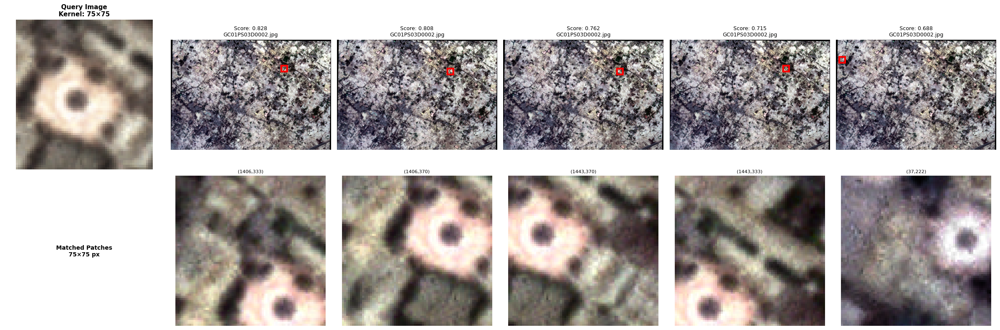


📊 Visualizing kernel 85×85


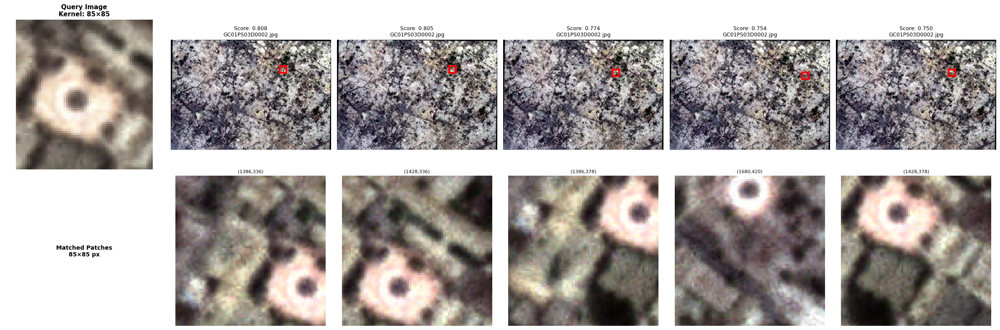


📊 Visualizing kernel 95×95


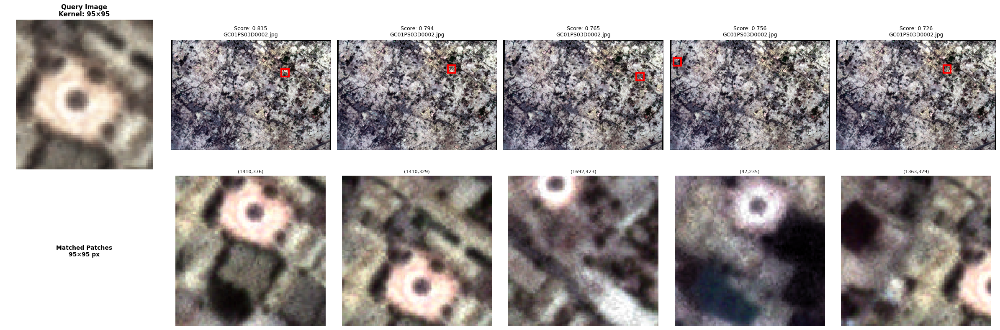

✅ Separate visualizations displayed

STEP 5b: Visualizing Combined Results (All Kernels)

Creating COMBINED visualization with all kernel sizes


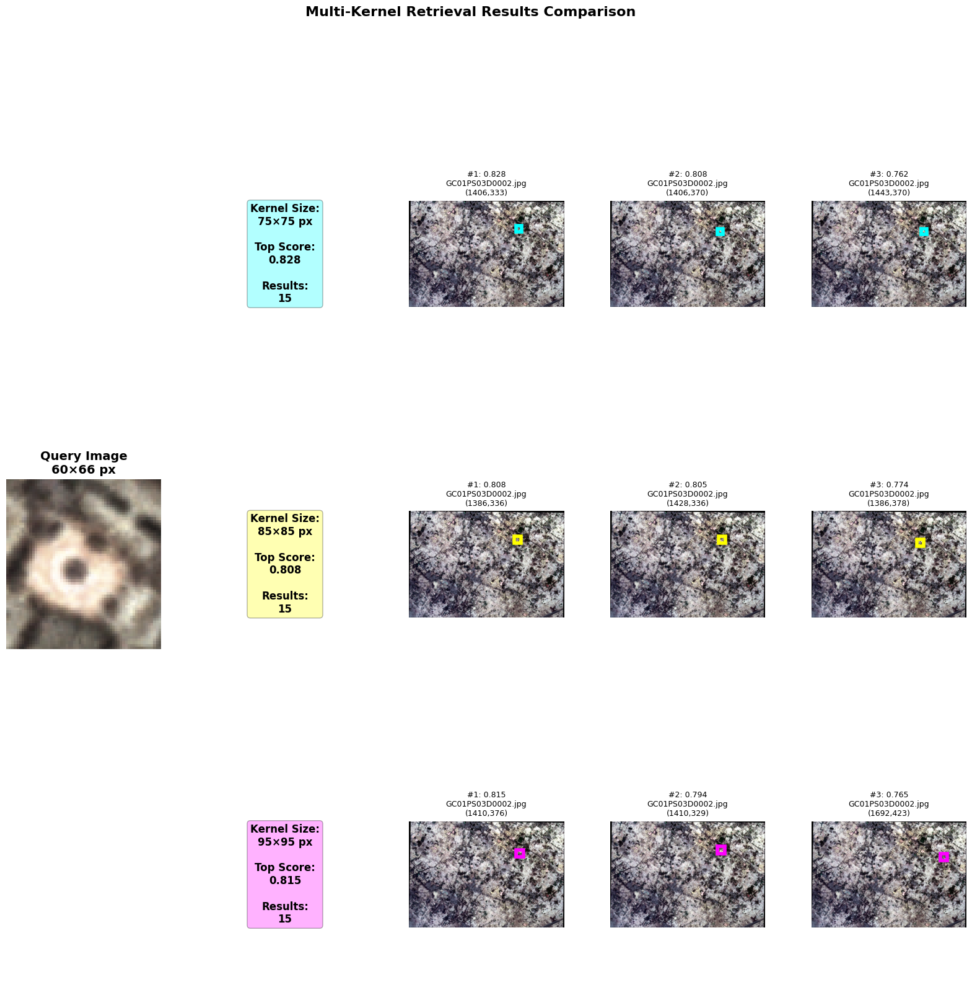

✅ Combined visualization displayed

STEP 5c: Merging Overlapping Patches

MERGING OVERLAPPING PATCHES FROM ALL KERNELS
Total patches across all kernels: 45
After merging: 15 unified regions

📊 Merged Patches Summary:
  1. GC01PS03D0002.jpg
     Size: 95×95 px | Scores: avg=0.815, max=0.815
     Combined from 1 patches (kernels: 95×95)
  2. GC01PS03D0002.jpg
     Size: 155×142 px | Scores: avg=0.769, max=0.828
     Combined from 11 patches (kernels: 85×85, 95×95, 75×75)
  3. GC01PS03D0002.jpg
     Size: 169×148 px | Scores: avg=0.695, max=0.765
     Combined from 12 patches (kernels: 85×85, 95×95, 75×75)
  4. GC01PS03D0001.jpg
     Size: 85×85 px | Scores: avg=0.694, max=0.694
     Combined from 1 patches (kernels: 85×85)
  5. GC01PS03D0002.jpg
     Size: 85×127 px | Scores: avg=0.683, max=0.690
     Combined from 2 patches (kernels: 85×85)
  6. GC01PS03D0002.jpg
     Size: 152×152 px | Scores: avg=0.681, max=0.756
     Combined from 9 patches (kernels: 85×85, 95×95, 75×75)
  7. GC01PS0

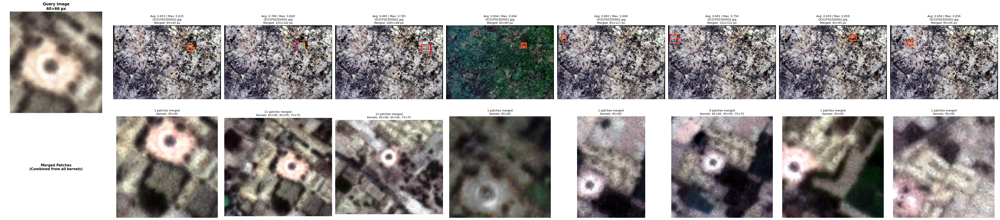

✅ Merged 15 unified regions

QUERY COMPLETE!
Query image: 02.png
Total matches found: 45
Merged regions: 15

Top 5 Merged Regions:
  1. GC01PS03D0002.jpg
     - Size: 95×95 px
     - Avg Score: 0.815, Max Score: 0.815
     - From 1 patches
  2. GC01PS03D0002.jpg
     - Size: 155×142 px
     - Avg Score: 0.769, Max Score: 0.828
     - From 11 patches
  3. GC01PS03D0002.jpg
     - Size: 169×148 px
     - Avg Score: 0.695, Max Score: 0.765
     - From 12 patches
  4. GC01PS03D0001.jpg
     - Size: 85×85 px
     - Avg Score: 0.694, Max Score: 0.694
     - From 1 patches
  5. GC01PS03D0002.jpg
     - Size: 85×127 px
     - Avg Score: 0.683, Max Score: 0.690
     - From 2 patches

All visualizations displayed!
Results stored in 'query_results' variable for further analysis.

ACCESSING RESULTS

You can access results using:
  - query_results['all_results']: Dictionary of results per kernel
  - query_results['merged_patches']: List of merged patches
  - query_results['query_path']: Path to que

In [4]:
"""
FILE 3: Query and Visualization Script
========================================
This file loads pre-trained indexes and performs queries with visualization.
Run this after training (File 2).

Usage in Jupyter:
    1. First run: %run 1_model_classes.py
    2. Then execute the cells below
"""

from pathlib import Path
from PIL import Image
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
QUERY_IMAGE_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder/02.png"
INDEX_PREFIX = "multi_kernel_index"

# Query parameters
COMPRESS_QUERY = False  # Set True to compress query image before searching
COMPRESSION_SIZE = (50, 50)  # Target size if compressing
TOP_K = 15  # Number of results to retrieve per kernel
MERGE_IOU_THRESHOLD = 0.3  # IoU threshold for merging overlapping patches
QUERY_STRIDE_RATIO = 0.3  # Overlap ratio for query patch extraction

# Visualization options
VISUALIZE_SEPARATE = True  # Show results separately for each kernel
VISUALIZE_COMBINED = True  # Show all kernels in one figure
VISUALIZE_MERGED = True  # Show merged patches from all kernels

# Kernel sizes (must match training)
QUERY_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

# Device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - INFERENCE")
print("=" * 80)
print(f"Query Image: {Path(QUERY_IMAGE_PATH).name}")
print(f"Index Prefix: {INDEX_PREFIX}")
print(f"Device: {DEVICE}")
print(f"Top K: {TOP_K}")
print(f"Kernel Sizes: {QUERY_KERNEL_SIZES}")
print("=" * 80)


# ==================== STEP 1: VERIFY QUERY IMAGE ====================
print("\n" + "=" * 80)
print("STEP 1: Loading Query Image")
print("=" * 80)

query_path = Path(QUERY_IMAGE_PATH)
if not query_path.exists():
    raise FileNotFoundError(f"Query image not found: {QUERY_IMAGE_PATH}")

with Image.open(QUERY_IMAGE_PATH) as img:
    query_size = img.size
    print(f"✅ Query image loaded: {query_path.name}")
    print(f"   - Size: {query_size[0]}×{query_size[1]} px")
    print(f"   - Mode: {img.mode}")

# Optional compression
if COMPRESS_QUERY:
    compressed_path = str(query_path).replace(
        query_path.suffix, 
        f"_compressed_{COMPRESSION_SIZE[0]}x{COMPRESSION_SIZE[1]}{query_path.suffix}"
    )
    
    with Image.open(QUERY_IMAGE_PATH) as img:
        img_resized = img.resize(COMPRESSION_SIZE, Image.Resampling.LANCZOS)
        img_resized.save(compressed_path)
    
    print(f"✅ Compressed query saved: {Path(compressed_path).name}")
    print(f"   - New size: {COMPRESSION_SIZE[0]}×{COMPRESSION_SIZE[1]} px")
    final_query_path = compressed_path
else:
    final_query_path = QUERY_IMAGE_PATH
    print(f"   - Using original query (no compression)")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=QUERY_KERNEL_SIZES,
    device=DEVICE,
    batch_size=16
)

print("✅ System initialized")


# ==================== STEP 3: LOAD PRE-TRAINED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Loading Pre-trained Indexes")
print("=" * 80)

system.load_saved_indexes(INDEX_PREFIX)


# ==================== STEP 4: SEARCH WITH ALL KERNELS ====================
print("\n" + "=" * 80)
print("STEP 4: Searching with All Kernel Sizes")
print("=" * 80)

all_results = system.search_all_kernels(
    query_image=final_query_path,
    top_k=TOP_K,
    query_stride_ratio=QUERY_STRIDE_RATIO,
    aggregation="max"
)

# Print summary
print("\n📊 Search Results Summary:")
total_results = 0
for kernel_size, results in all_results.items():
    if results:
        total_results += len(results)
        print(f"  Kernel {kernel_size[0]}×{kernel_size[1]}: {len(results)} matches")
        print(f"    Top-3 scores: {[f'{r.similarity_score:.3f}' for r in results[:3]]}")

if total_results == 0:
    print("⚠️  No results found! Check if indexes were loaded correctly.")
    import sys
    sys.exit(1)


# ==================== STEP 5: VISUALIZE SEPARATE RESULTS ====================
if VISUALIZE_SEPARATE and all_results:
    print("\n" + "=" * 80)
    print("STEP 5a: Visualizing Separate Results for Each Kernel")
    print("=" * 80)
    
    system.visualize_separate_kernel_results(
        all_results,
        query_image=final_query_path,
        num_display=5,
        save_prefix=f"results_{Path(final_query_path).stem}"
    )
    
    print("✅ Separate visualizations displayed")


# ==================== STEP 6: VISUALIZE COMBINED RESULTS ====================
if VISUALIZE_COMBINED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5b: Visualizing Combined Results (All Kernels)")
    print("=" * 80)
    
    system.visualize_combined_all_kernels(
        all_results,
        query_image=final_query_path,
        num_display_per_kernel=3,
        save_path=f"combined_all_kernels_{Path(final_query_path).stem}.png"
    )
    
    print("✅ Combined visualization displayed")


# ==================== STEP 7: MERGE AND VISUALIZE PATCHES ====================
if VISUALIZE_MERGED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5c: Merging Overlapping Patches")
    print("=" * 80)
    
    merged_patches = system.merge_and_visualize_all_patches(
        all_results,
        query_image=final_query_path,
        iou_threshold=MERGE_IOU_THRESHOLD,
        max_display=8,
        save_path=f"merged_patches_{Path(final_query_path).stem}.png"
    )
    
    print(f"✅ Merged {len(merged_patches)} unified regions")
    
    # Store results for further analysis
    query_results = {
        'all_results': all_results,
        'merged_patches': merged_patches,
        'query_path': final_query_path
    }
else:
    query_results = {
        'all_results': all_results,
        'merged_patches': None,
        'query_path': final_query_path
    }


# ==================== FINAL SUMMARY ====================
print("\n" + "=" * 80)
print("QUERY COMPLETE!")
print("=" * 80)
print(f"Query image: {Path(final_query_path).name}")
print(f"Total matches found: {sum(len(r) for r in all_results.values())}")

if merged_patches:
    print(f"Merged regions: {len(merged_patches)}")
    print(f"\nTop 5 Merged Regions:")
    for i, merged in enumerate(merged_patches[:5], 1):
        print(f"  {i}. {Path(merged.image_path).name}")
        print(f"     - Size: {merged.width}×{merged.height} px")
        print(f"     - Avg Score: {merged.avg_score:.3f}, Max Score: {merged.max_score:.3f}")
        print(f"     - From {len(merged.contributing_patches)} patches")

print("\n" + "=" * 80)
print("All visualizations displayed!")
print("Results stored in 'query_results' variable for further analysis.")
print("=" * 80)


# ==================== OPTIONAL: ACCESS INDIVIDUAL RESULTS ====================
print("\n" + "=" * 80)
print("ACCESSING RESULTS")
print("=" * 80)
print("\nYou can access results using:")
print("  - query_results['all_results']: Dictionary of results per kernel")
print("  - query_results['merged_patches']: List of merged patches")
print("  - query_results['query_path']: Path to query image used")
print("\nExample:")
print("  # Get results for 75×75 kernel")
print("  results_75 = query_results['all_results'][(75, 75)]")
print("  print(f'Found {len(results_75)} matches with 75×75 kernel')")
print("\n  # Get top merged patch")
print("  if query_results['merged_patches']:")
print("      top_patch = query_results['merged_patches'][0]")
print("      print(f'Top match: {top_patch.image_path}')")
print("=" * 80)

MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - INFERENCE
Query Image: 08.png
Index Prefix: multi_kernel_index
Device: cuda
Top K: 15
Kernel Sizes: [(75, 75), (85, 85), (95, 95)]

STEP 1: Loading Query Image
✅ Query image loaded: 08.png
   - Size: 54×40 px
   - Mode: RGB
   - Using original query (no compression)

STEP 2: Initializing Multi-Kernel System
Loading DINOv3 model: facebook/dinov3-vitb16-pretrain-lvd1689m
DINOv3 model loaded. Hidden size: 768
✅ System initialized

STEP 3: Loading Pre-trained Indexes

📂 Loading pre-computed indexes from: multi_kernel_index
  ✓ Loaded kernel 75×75: 14194 patches
  ✓ Loaded kernel 85×85: 11017 patches
  ✓ Loaded kernel 95×95: 8648 patches

STEP 4: Searching with All Kernel Sizes

Searching with all kernel sizes

🔍 Searching with kernel 75×75...
  ✅ Found 15 results. Top score: 0.7267

🔍 Searching with kernel 85×85...
  ✅ Found 15 results. Top score: 0.6015

🔍 Searching with kernel 95×95...
  ✅ Found 15 results. Top score: 0.5897

📊 Search Results Summ

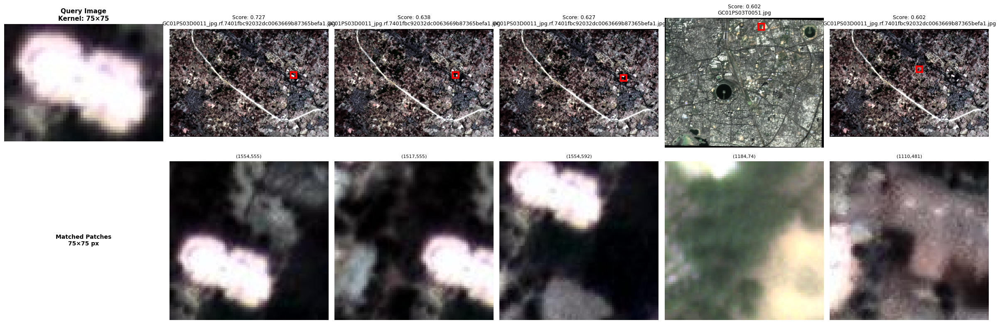


📊 Visualizing kernel 85×85


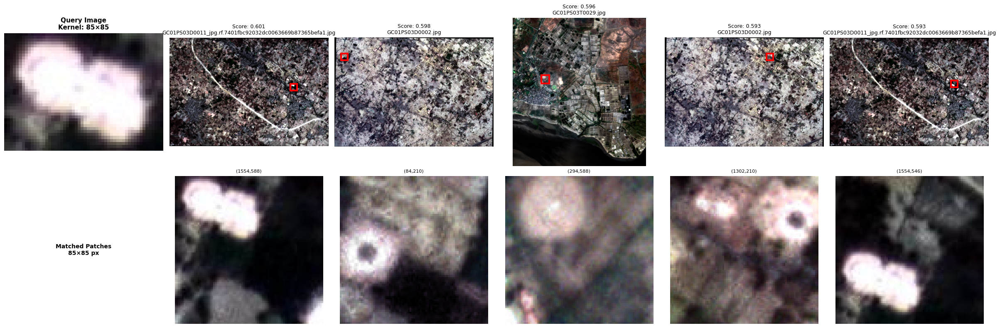


📊 Visualizing kernel 95×95


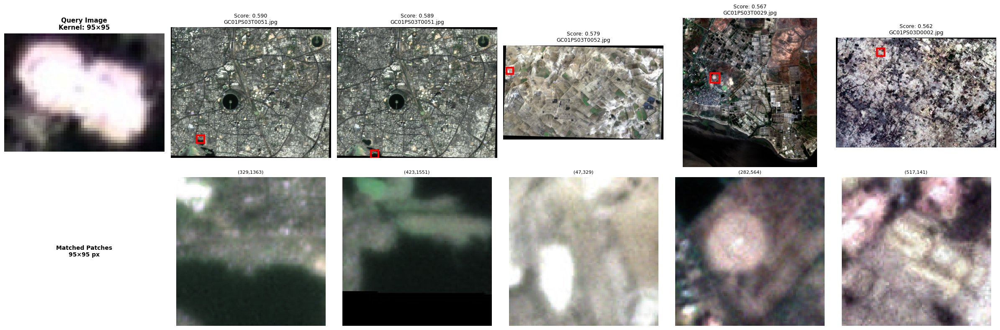

✅ Separate visualizations displayed

STEP 5b: Visualizing Combined Results (All Kernels)

Creating COMBINED visualization with all kernel sizes


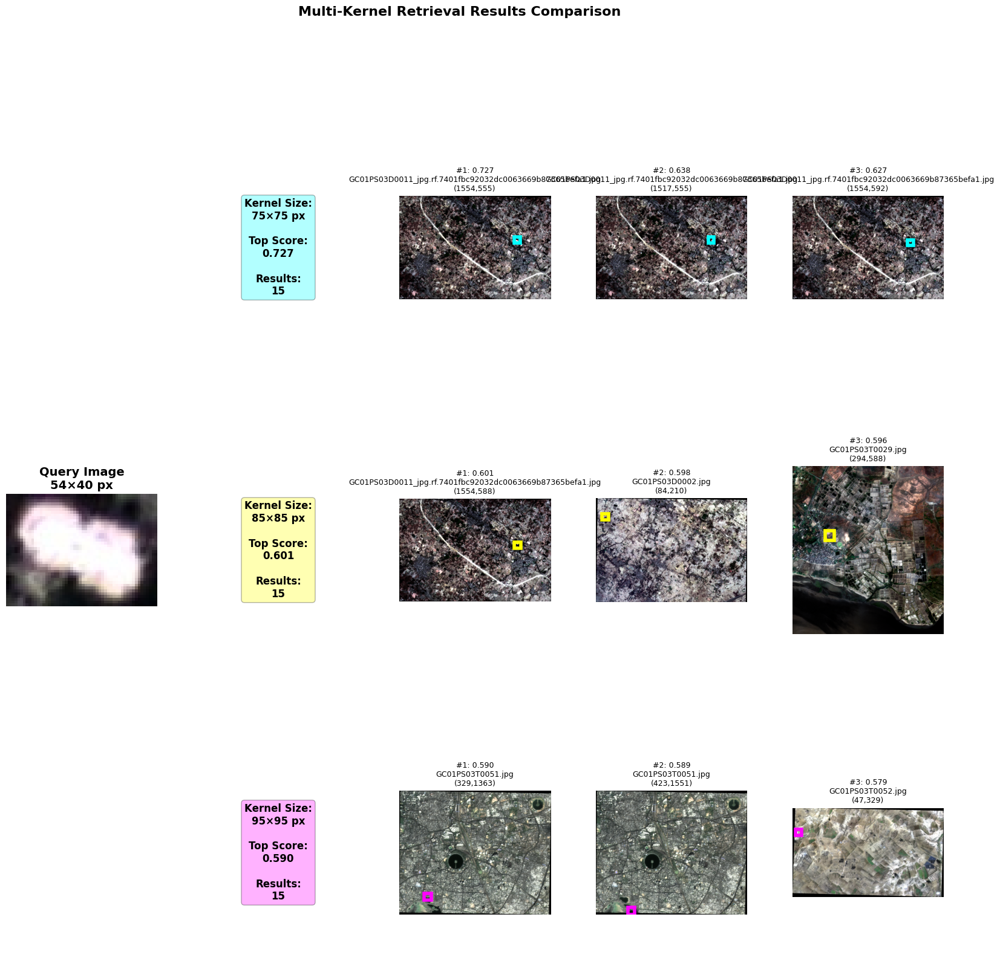

✅ Combined visualization displayed

STEP 5c: Merging Overlapping Patches

MERGING OVERLAPPING PATCHES FROM ALL KERNELS
Total patches across all kernels: 45
After merging: 25 unified regions

📊 Merged Patches Summary:
  1. GC01PS03D0011_jpg.rf.7401fbc92032dc0063669b87365befa1.jpg
     Size: 122×127 px | Scores: avg=0.637, max=0.727
     Combined from 5 patches (kernels: 85×85, 75×75)
  2. GC01PS03D0002.jpg
     Size: 85×85 px | Scores: avg=0.593, max=0.593
     Combined from 1 patches (kernels: 85×85)
  3. GC01PS03T0029.jpg
     Size: 75×75 px | Scores: avg=0.590, max=0.590
     Combined from 1 patches (kernels: 75×75)
  4. GC01PS03T0051.jpg
     Size: 133×95 px | Scores: avg=0.585, max=0.589
     Combined from 3 patches (kernels: 95×95, 75×75)
  5. GC01PS03T0051.jpg
     Size: 85×107 px | Scores: avg=0.582, max=0.602
     Combined from 2 patches (kernels: 85×85, 75×75)
  6. GC01PS03T0029.jpg
     Size: 97×127 px | Scores: avg=0.581, max=0.599
     Combined from 4 patches (kernels: 85×8

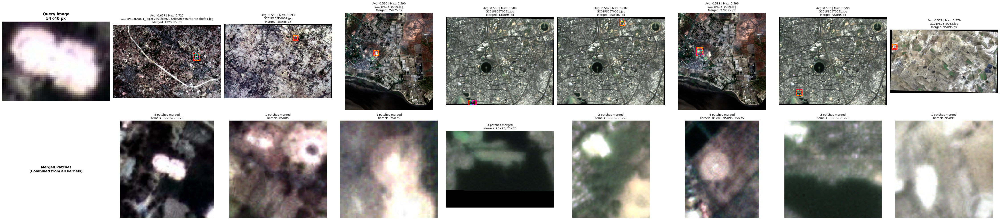

✅ Merged 25 unified regions

QUERY COMPLETE!
Query image: 08.png
Total matches found: 45
Merged regions: 25

Top 5 Merged Regions:
  1. GC01PS03D0011_jpg.rf.7401fbc92032dc0063669b87365befa1.jpg
     - Size: 122×127 px
     - Avg Score: 0.637, Max Score: 0.727
     - From 5 patches
  2. GC01PS03D0002.jpg
     - Size: 85×85 px
     - Avg Score: 0.593, Max Score: 0.593
     - From 1 patches
  3. GC01PS03T0029.jpg
     - Size: 75×75 px
     - Avg Score: 0.590, Max Score: 0.590
     - From 1 patches
  4. GC01PS03T0051.jpg
     - Size: 133×95 px
     - Avg Score: 0.585, Max Score: 0.589
     - From 3 patches
  5. GC01PS03T0051.jpg
     - Size: 85×107 px
     - Avg Score: 0.582, Max Score: 0.602
     - From 2 patches

All visualizations displayed!
Results stored in 'query_results' variable for further analysis.

ACCESSING RESULTS

You can access results using:
  - query_results['all_results']: Dictionary of results per kernel
  - query_results['merged_patches']: List of merged patches
  - que

In [5]:
"""
FILE 3: Query and Visualization Script
========================================
This file loads pre-trained indexes and performs queries with visualization.
Run this after training (File 2).

Usage in Jupyter:
    1. First run: %run 1_model_classes.py
    2. Then execute the cells below
"""

from pathlib import Path
from PIL import Image
import torch

# ==================== CONFIGURATION ====================
# Update these paths for your setup
QUERY_IMAGE_PATH = "/home/amarjeet/Desktop/Retrieval_engine_for_satellite_images/Untitled_folder/08.png"
INDEX_PREFIX = "multi_kernel_index"

# Query parameters
COMPRESS_QUERY = False  # Set True to compress query image before searching
COMPRESSION_SIZE = (50, 50)  # Target size if compressing
TOP_K = 15  # Number of results to retrieve per kernel
MERGE_IOU_THRESHOLD = 0.3  # IoU threshold for merging overlapping patches
QUERY_STRIDE_RATIO = 0.3  # Overlap ratio for query patch extraction

# Visualization options
VISUALIZE_SEPARATE = True  # Show results separately for each kernel
VISUALIZE_COMBINED = True  # Show all kernels in one figure
VISUALIZE_MERGED = True  # Show merged patches from all kernels

# Kernel sizes (must match training)
QUERY_KERNEL_SIZES = [(75, 75), (85, 85), (95, 95)]

# Device
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_NAME = "dinov3"

print("=" * 80)
print("MULTI-KERNEL SATELLITE IMAGE RETRIEVAL - INFERENCE")
print("=" * 80)
print(f"Query Image: {Path(QUERY_IMAGE_PATH).name}")
print(f"Index Prefix: {INDEX_PREFIX}")
print(f"Device: {DEVICE}")
print(f"Top K: {TOP_K}")
print(f"Kernel Sizes: {QUERY_KERNEL_SIZES}")
print("=" * 80)


# ==================== STEP 1: VERIFY QUERY IMAGE ====================
print("\n" + "=" * 80)
print("STEP 1: Loading Query Image")
print("=" * 80)

query_path = Path(QUERY_IMAGE_PATH)
if not query_path.exists():
    raise FileNotFoundError(f"Query image not found: {QUERY_IMAGE_PATH}")

with Image.open(QUERY_IMAGE_PATH) as img:
    query_size = img.size
    print(f"✅ Query image loaded: {query_path.name}")
    print(f"   - Size: {query_size[0]}×{query_size[1]} px")
    print(f"   - Mode: {img.mode}")

# Optional compression
if COMPRESS_QUERY:
    compressed_path = str(query_path).replace(
        query_path.suffix, 
        f"_compressed_{COMPRESSION_SIZE[0]}x{COMPRESSION_SIZE[1]}{query_path.suffix}"
    )
    
    with Image.open(QUERY_IMAGE_PATH) as img:
        img_resized = img.resize(COMPRESSION_SIZE, Image.Resampling.LANCZOS)
        img_resized.save(compressed_path)
    
    print(f"✅ Compressed query saved: {Path(compressed_path).name}")
    print(f"   - New size: {COMPRESSION_SIZE[0]}×{COMPRESSION_SIZE[1]} px")
    final_query_path = compressed_path
else:
    final_query_path = QUERY_IMAGE_PATH
    print(f"   - Using original query (no compression)")


# ==================== STEP 2: INITIALIZE SYSTEM ====================
print("\n" + "=" * 80)
print("STEP 2: Initializing Multi-Kernel System")
print("=" * 80)

system = MultiKernelRetrievalSystem(
    model_name=MODEL_NAME,
    kernel_sizes=QUERY_KERNEL_SIZES,
    device=DEVICE,
    batch_size=16
)

print("✅ System initialized")


# ==================== STEP 3: LOAD PRE-TRAINED INDEXES ====================
print("\n" + "=" * 80)
print("STEP 3: Loading Pre-trained Indexes")
print("=" * 80)

system.load_saved_indexes(INDEX_PREFIX)


# ==================== STEP 4: SEARCH WITH ALL KERNELS ====================
print("\n" + "=" * 80)
print("STEP 4: Searching with All Kernel Sizes")
print("=" * 80)

all_results = system.search_all_kernels(
    query_image=final_query_path,
    top_k=TOP_K,
    query_stride_ratio=QUERY_STRIDE_RATIO,
    aggregation="max"
)

# Print summary
print("\n📊 Search Results Summary:")
total_results = 0
for kernel_size, results in all_results.items():
    if results:
        total_results += len(results)
        print(f"  Kernel {kernel_size[0]}×{kernel_size[1]}: {len(results)} matches")
        print(f"    Top-3 scores: {[f'{r.similarity_score:.3f}' for r in results[:3]]}")

if total_results == 0:
    print("⚠️  No results found! Check if indexes were loaded correctly.")
    import sys
    sys.exit(1)


# ==================== STEP 5: VISUALIZE SEPARATE RESULTS ====================
if VISUALIZE_SEPARATE and all_results:
    print("\n" + "=" * 80)
    print("STEP 5a: Visualizing Separate Results for Each Kernel")
    print("=" * 80)
    
    system.visualize_separate_kernel_results(
        all_results,
        query_image=final_query_path,
        num_display=5,
        save_prefix=f"results_{Path(final_query_path).stem}"
    )
    
    print("✅ Separate visualizations displayed")


# ==================== STEP 6: VISUALIZE COMBINED RESULTS ====================
if VISUALIZE_COMBINED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5b: Visualizing Combined Results (All Kernels)")
    print("=" * 80)
    
    system.visualize_combined_all_kernels(
        all_results,
        query_image=final_query_path,
        num_display_per_kernel=3,
        save_path=f"combined_all_kernels_{Path(final_query_path).stem}.png"
    )
    
    print("✅ Combined visualization displayed")


# ==================== STEP 7: MERGE AND VISUALIZE PATCHES ====================
if VISUALIZE_MERGED and all_results:
    print("\n" + "=" * 80)
    print("STEP 5c: Merging Overlapping Patches")
    print("=" * 80)
    
    merged_patches = system.merge_and_visualize_all_patches(
        all_results,
        query_image=final_query_path,
        iou_threshold=MERGE_IOU_THRESHOLD,
        max_display=8,
        save_path=f"merged_patches_{Path(final_query_path).stem}.png"
    )
    
    print(f"✅ Merged {len(merged_patches)} unified regions")
    
    # Store results for further analysis
    query_results = {
        'all_results': all_results,
        'merged_patches': merged_patches,
        'query_path': final_query_path
    }
else:
    query_results = {
        'all_results': all_results,
        'merged_patches': None,
        'query_path': final_query_path
    }


# ==================== FINAL SUMMARY ====================
print("\n" + "=" * 80)
print("QUERY COMPLETE!")
print("=" * 80)
print(f"Query image: {Path(final_query_path).name}")
print(f"Total matches found: {sum(len(r) for r in all_results.values())}")

if merged_patches:
    print(f"Merged regions: {len(merged_patches)}")
    print(f"\nTop 5 Merged Regions:")
    for i, merged in enumerate(merged_patches[:5], 1):
        print(f"  {i}. {Path(merged.image_path).name}")
        print(f"     - Size: {merged.width}×{merged.height} px")
        print(f"     - Avg Score: {merged.avg_score:.3f}, Max Score: {merged.max_score:.3f}")
        print(f"     - From {len(merged.contributing_patches)} patches")

print("\n" + "=" * 80)
print("All visualizations displayed!")
print("Results stored in 'query_results' variable for further analysis.")
print("=" * 80)


# ==================== OPTIONAL: ACCESS INDIVIDUAL RESULTS ====================
print("\n" + "=" * 80)
print("ACCESSING RESULTS")
print("=" * 80)
print("\nYou can access results using:")
print("  - query_results['all_results']: Dictionary of results per kernel")
print("  - query_results['merged_patches']: List of merged patches")
print("  - query_results['query_path']: Path to query image used")
print("\nExample:")
print("  # Get results for 75×75 kernel")
print("  results_75 = query_results['all_results'][(75, 75)]")
print("  print(f'Found {len(results_75)} matches with 75×75 kernel')")
print("\n  # Get top merged patch")
print("  if query_results['merged_patches']:")
print("      top_patch = query_results['merged_patches'][0]")
print("      print(f'Top match: {top_patch.image_path}')")
print("=" * 80)